<a href="https://colab.research.google.com/github/furrutiav/labs-edpn/blob/main/Laboratorio_4.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

*Universidad de Chile*  
*Facultad de Ciencias Físicas y Matemáticas*  
*Departamento de Ingeniería Matemática*

**MA5307-1 Análisis Numérico de EDP: Teoría y Laboratorio**  
**Profesor:** Axel Osses  
**Auxiliares:** Emir Chacra  
**Integrantes:** Felipe Urrutia, Daniel Minaya, Sebastian Toloza

# **Laboratorio 4**

##Instalación de FEnics

In [1]:
try:
    import google.colab  # noqa: F401
except ImportError:
    from dolfinx import *
else:
  try:
      from dolfinx import *
  except ImportError:
      !wget "https://fem-on-colab.github.io/releases/fenicsx-install-real.sh" -O "/tmp/fenicsx-install.sh" && bash "/tmp/fenicsx-install.sh"
      from dolfinx import *

!pip install -q gmsh

--2022-05-02 19:52:12--  https://fem-on-colab.github.io/releases/fenicsx-install-real.sh
Resolving fem-on-colab.github.io (fem-on-colab.github.io)... 185.199.108.153, 185.199.109.153, 185.199.110.153, ...
Connecting to fem-on-colab.github.io (fem-on-colab.github.io)|185.199.108.153|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 3055 (3.0K) [application/x-sh]
Saving to: ‘/tmp/fenicsx-install.sh’

/tmp/fenicsx-instal 100%[===================>]   2.98K  --.-KB/s    in 0s      

2022-05-02 19:52:12 (41.1 MB/s) - ‘/tmp/fenicsx-install.sh’ saved [3055/3055]

+ SHARE_PREFIX=/usr/local/share/fem-on-colab
+ FENICSX_INSTALLED=/usr/local/share/fem-on-colab/fenicsx.installed
+ [[ ! -f /usr/local/share/fem-on-colab/fenicsx.installed ]]
+ PYBIND11_INSTALL_SCRIPT_PATH=https://github.com/fem-on-colab/fem-on-colab.github.io/raw/60fe1e0/releases/pybind11-install.sh
+ [[ https://github.com/fem-on-colab/fem-on-colab.github.io/raw/60fe1e0/releases/pybind11-install.sh == http* ]]


In [2]:
!pip install -q piglet pyvirtualdisplay
!pip install -q pyvista
!apt-get -qq install xvfb

     |████████████████████████████████| 67 kB 2.7 MB/s 
     |████████████████████████████████| 1.4 MB 4.1 MB/s 


##Librerías

In [1]:
import ufl
import gmsh
import pyvista
import numpy as np
import sys
from mpi4py import MPI
from dolfinx import io
from dolfinx import cpp
from dolfinx import fem
from dolfinx import mesh
from dolfinx import plot
from petsc4py import PETSc
import matplotlib.pyplot as plt
from petsc4py.PETSc import ScalarType

from pyvirtualdisplay import Display
display = Display(visible=0, size=(600, 400))
display.start()

%matplotlib inline
pyvista.OFF_SCREEN=False
pyvista.set_jupyter_backend("static")

## **Ejercicio 1**

Escriba un programa en Python que resuelva $(P_a)$ utilizando FEniCS. Grafique su solucion y la malla utilizada para $a_1=1$, $(a,b)=(0,0)$ y $r=0.5$. Comente.

In [2]:
def solve1(a=0, b=0, r=0.5, a1=1, showgrid=True):
    #Primero, inicializar gmsh
    gmsh.initialize(sys.argv)

    #Parametros de la geometría
    gdim = 2

    #Omega1 y Omega2
    square = gmsh.model.occ.addRectangle(-1,-1,0, 2, 2)
    circle = gmsh.model.occ.addDisk(a, b, 0, r, r)

    #Restando dominios, Omega = Omega1\Omega2
    domain = gmsh.model.occ.cut([(gdim, square)], [(gdim, circle)])
    gmsh.model.occ.synchronize()

    #Definiendo la parte del dominio en la que se define la solución
    volumes = gmsh.model.getEntities(dim=gdim)
    status = gmsh.model.addPhysicalGroup(volumes[0][0], [volumes[0][1]])

    #Fijando parametros de la grilla y generándola
    gmsh.option.setNumber("Mesh.CharacteristicLengthMin",0.05)
    gmsh.option.setNumber("Mesh.CharacteristicLengthMax",0.05)
    gmsh.model.mesh.generate(gdim)

    #Todo lo de esta celda sirve para pasar la malla desde gmsh hasta dolphinx
    #solo importa si van a trabajar con multiprocesos, pero hay que correrlo igual.
    if MPI.COMM_WORLD.rank == 0:
        # Get mesh geometry
        geometry_data = io.extract_gmsh_geometry(gmsh.model)
        # Get mesh topology for each element
        topology_data = io.extract_gmsh_topology_and_markers(gmsh.model)

    # Extract the cell type and number of nodes per cell and broadcast
    # it to the other processors 
    if MPI.COMM_WORLD.rank == 0:
        # Extract the cell type and number of nodes per cell and broadcast
        # it to the other processors 
        gmsh_cell_type = list(topology_data.keys())[0]    
        properties = gmsh.model.mesh.getElementProperties(gmsh_cell_type)
        name, dim, order, num_nodes, local_coords, _ = properties
        cells = topology_data[gmsh_cell_type]["topology"]
        cell_id, num_nodes = MPI.COMM_WORLD.bcast([gmsh_cell_type, num_nodes], root=0)
    else:        
        cell_id, num_nodes = MPI.COMM_WORLD.bcast([None, None], root=0)
        cells, geometry_data = np.empty([0, num_nodes]), np.empty([0, gdim])

    # Permute topology data from MSH-ordering to dolfinx-ordering
    ufl_domain = io.ufl_mesh_from_gmsh(cell_id, gdim)
    gmsh_cell_perm = io.cell_perm_gmsh(cpp.mesh.to_type(str(ufl_domain.ufl_cell())), num_nodes)
    cells = cells[:, gmsh_cell_perm]

    # Generando el dominio
    domain = mesh.create_mesh(MPI.COMM_WORLD, cells, geometry_data[:, :gdim], ufl_domain)

    # Generando el espacio de funciones
    V = fem.FunctionSpace(domain, ("CG", 1))

    # Definiendo las fronteras del dominio
    def boundary_circle(x):
        return np.isclose((x[0]-a)**2 + (x[1]-b)**2 - r**2, 0)

    def boundary_square_h(x):
        return np.isclose(abs(x[1]), 1)

    def boundary_square_v(x):
        return np.isclose(abs(x[0]), 1)

    dofs_circle = fem.locate_dofs_geometrical(V, boundary_circle)
    dofs_h = fem.locate_dofs_geometrical(V, boundary_square_h)
    dofs_v = fem.locate_dofs_geometrical(V, boundary_square_v)

    # Graficamos la malla que utilizaremos
    if showgrid:
        tdim = domain.topology.dim
        topology, cell_types, geometry = plot.create_vtk_mesh(domain, tdim)
        grid = pyvista.UnstructuredGrid(topology, cell_types, geometry)

        plotter = pyvista.Plotter(notebook=True)
        plotter.add_title('Malla utilizada', font_size=10)
        plotter.add_mesh(grid, show_edges=True)
        plotter.view_xy()
        plotter.show()

    # Función nula
    zero = fem.Function(V)
    zero.interpolate(lambda x: x[0]*0.0)
    
    # Función g(x,y)=alpha(1-x^2) con alpha=200
    fun1 = fem.Function(V)
    fun1.interpolate(lambda x: 200 * (1-x[0]*x[0]))

    # Agregando condiciones de borde a cada sección de la frontera del dominio
    bc_circle = fem.dirichletbc(zero, dofs_circle)
    bc_h = fem.dirichletbc(fun1, dofs_h)
    bc_v = fem.dirichletbc(zero, dofs_v)

    bcs = [bc_circle, bc_h, bc_v]

    #Formulacion variacional
    u = ufl.TrialFunction(V)
    v = ufl.TestFunction(V)
    f = fem.Constant(domain, ScalarType(0.0))

    A = a1 * ufl.dot(ufl.grad(u), ufl.grad(v)) * ufl.dx
    L = f * v * ufl.dx

    #Resolvemos
    problem = fem.petsc.LinearProblem(A, L, bcs=bcs, petsc_options={"ksp_type": "preonly", "pc_type": "lu"})
    uh = problem.solve()

    #Extraemos información del espacio funcional para graficar la solución
    u_topology, u_cell_types, u_geometry = plot.create_vtk_mesh(V)

    #Creamos la grilla de la función a evaluar
    u_grid = pyvista.UnstructuredGrid(u_topology, u_cell_types, u_geometry)
    u_grid.point_data["u"] = uh.x.array.real
    u_grid.set_active_scalars("u")
    u_plotter = pyvista.Plotter(notebook = True) #Importante el argumento notebook
    u_plotter.add_mesh(u_grid, show_edges=True)
    u_plotter.add_title('Solución obtenida', font_size=10)
    u_plotter.view_xy()
    u_plotter.show()

    #Cerramos el gmsh
    gmsh.finalize()

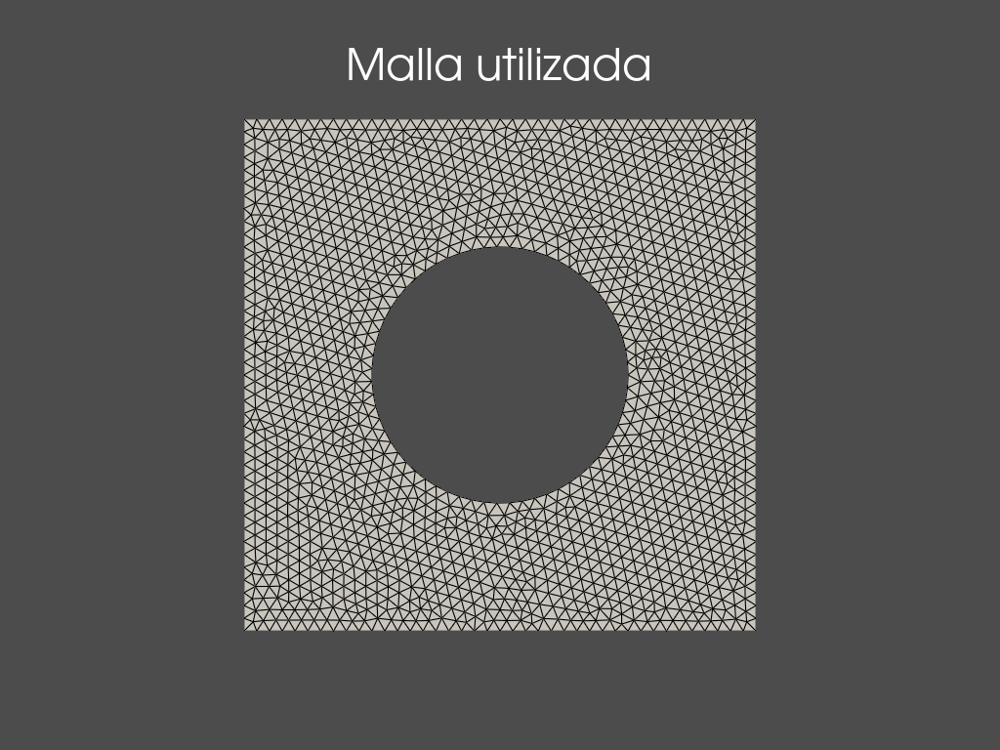

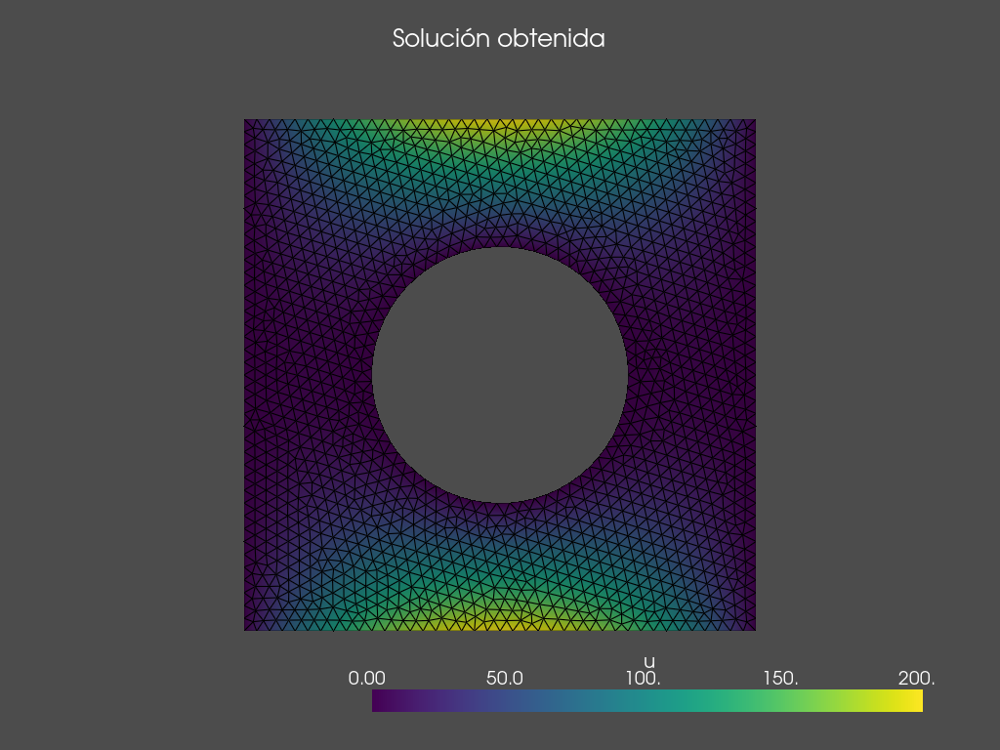

In [3]:
solve1()

**Comentarios:** Podemos notar que el borde de $\Omega_2$ es cero. Ademas, el borde de $\Omega_1$ corresponde a las condiciones de borde, verticales nulas y horizontales con mayor temperatura en la zona media. Se propaga el calor desde los borde hacia el interiore del dominio perforado. Por otro lado, se observa que el cilindro esta helado por lo que hacia las zonas de mayor temperatura, el color se difumina.

## **Ejercicio 2**


**a.** Escriba un programa en Python que resuelva $(P_b)$ utilizando FEniCS. (**Indicación**: por defecto, si usted NO asocia
una condicion a alguno de los bordes, FEniCS asociara a ese borde una condición de borde libre). 

In [37]:
def solve2(a, b, r, a1, lmin, lmax, bgrid=True): 
    #Primero, inicializar gmsh
    gmsh.initialize(sys.argv)

    #Parametros de la geometría
    gdim = 2

    #Omega1 y Omega2
    square = gmsh.model.occ.addRectangle(-1,-1,0, 2, 2)
    circle = gmsh.model.occ.addDisk(a, b, 0, r, r)

    #Restando dominios, Omega = Omega1\Omega2
    domain = gmsh.model.occ.cut([(gdim, square)], [(gdim, circle)])
    gmsh.model.occ.synchronize()

    #Definiendo la parte del dominio en la que se define la solución
    volumes = gmsh.model.getEntities(dim=gdim)
    status = gmsh.model.addPhysicalGroup(volumes[0][0], [volumes[0][1]])

    #Fijando parametros de la grilla y generándola
    gmsh.option.setNumber("Mesh.CharacteristicLengthMin",lmin)
    gmsh.option.setNumber("Mesh.CharacteristicLengthMax",lmax)
    gmsh.model.mesh.generate(gdim)

    #Todo lo de esta celda sirve para pasar la malla desde gmsh hasta dolphinx
    #solo importa si van a trabajar con multiprocesos, pero hay que correrlo igual.
    if MPI.COMM_WORLD.rank == 0:
        # Get mesh geometry
        geometry_data = io.extract_gmsh_geometry(gmsh.model)
        # Get mesh topology for each element
        topology_data = io.extract_gmsh_topology_and_markers(gmsh.model)

    # Extract the cell type and number of nodes per cell and broadcast
    # it to the other processors 
    if MPI.COMM_WORLD.rank == 0:
        # Extract the cell type and number of nodes per cell and broadcast
        # it to the other processors 
        gmsh_cell_type = list(topology_data.keys())[0]    
        properties = gmsh.model.mesh.getElementProperties(gmsh_cell_type)
        name, dim, order, num_nodes, local_coords, _ = properties
        cells = topology_data[gmsh_cell_type]["topology"]
        cell_id, num_nodes = MPI.COMM_WORLD.bcast([gmsh_cell_type, num_nodes], root=0)
    else:        
        cell_id, num_nodes = MPI.COMM_WORLD.bcast([None, None], root=0)
        cells, geometry_data = np.empty([0, num_nodes]), np.empty([0, gdim])

    # Permute topology data from MSH-ordering to dolfinx-ordering
    ufl_domain = io.ufl_mesh_from_gmsh(cell_id, gdim)
    gmsh_cell_perm = io.cell_perm_gmsh(cpp.mesh.to_type(str(ufl_domain.ufl_cell())), num_nodes)
    cells = cells[:, gmsh_cell_perm]

    # Generando el dominio
    domain = mesh.create_mesh(MPI.COMM_WORLD, cells, geometry_data[:, :gdim], ufl_domain)
    V = fem.FunctionSpace(domain, ("CG", 1))

    # Definiendo las fronteras del dominio
    def boundary_circle(x):
        return np.isclose((x[0]-a)**2 + (x[1]-b)**2 - r**2, 0)

    def boundary_square_h(x):
        return np.isclose(abs(x[1]), 1)

    def boundary_square_v(x):
        return np.isclose(abs(x[0]), 1)

    dofs_circle = fem.locate_dofs_geometrical(V, boundary_circle)
    dofs_h = fem.locate_dofs_geometrical(V, boundary_square_h)
    dofs_v = fem.locate_dofs_geometrical(V, boundary_square_v)

    #Función nula
    zero = fem.Function(V)
    zero.interpolate(lambda x: x[0]*0.0)

    # Función g(x,y)=alpha(1-x^2) con alpha=200
    fun1 = fem.Function(V)
    fun1.interpolate(lambda x: 200 * (1-x[0]*x[0]))

    # Agregando condiciones de borde a cada sección de la frontera del dominio
    bc_h = fem.dirichletbc(fun1, dofs_h)
    bc_v = fem.dirichletbc(zero, dofs_v)

    # No agregamos condiciones a la frontera del círculo
    bcs = [bc_h, bc_v]

    #Formulación variacional
    u = ufl.TrialFunction(V)
    v = ufl.TestFunction(V)
    f = fem.Constant(domain, ScalarType(0.0))

    A = a1 * ufl.dot(ufl.grad(u), ufl.grad(v)) * ufl.dx
    L = f * v * ufl.dx

    #Solucion
    problem = fem.petsc.LinearProblem(A, L, bcs=bcs, petsc_options={"ksp_type": "preonly", "pc_type": "lu"})
    uh = problem.solve()

    #Extraemos información necesaria para graficar la grilla
    tdim = domain.topology.dim
    topology, cell_types, geometry = plot.create_vtk_mesh(domain, tdim)
    grid = pyvista.UnstructuredGrid(topology, cell_types, geometry)

    #Extraemos información del espacio funcional para graficar la solución
    u_topology, u_cell_types, u_geometry = plot.create_vtk_mesh(V)
    
    #Determinar temperatura media
    uh_fun = uh.x.array.real
    ind_borde = [i in dofs_circle for i in range(len(uh_fun))]
    mean_tem = np.mean(uh_fun[ind_borde])

    #Creamos la grilla de la función a evaluar
    u_grid = pyvista.UnstructuredGrid(u_topology, u_cell_types, u_geometry)
    u_grid.point_data["u"] = uh_fun#uh.x.array.real
    u_grid.set_active_scalars("u")
    u_plotter = pyvista.Plotter(notebook = True) #Importante el argumento notebook
    u_plotter.add_mesh(u_grid, show_edges=bgrid)
    u_plotter.add_title(f"a: {a}, b: {b}, r: {r}, a1: {a1}, malla: {lmin}, t° media: {mean_tem: .4f}", font_size=10)
    u_plotter.view_xy()
    u_plotter.show()
  
    #Cerramos el gmsh
    gmsh.finalize()

**Observación:** Al no agregar condiciones de borde en $\Omega_2$ por defecto se pone una condición de Neumann $\frac{\partial u}{\partial n}=0$ en $\Omega_2$.

**b.** Grafique la solucion de $(P_b)$ para $(a,b)=(0,0)$, $r=0.5$ y $a_1\in\{1,10,20,100\}$. Comenten sus resultados.

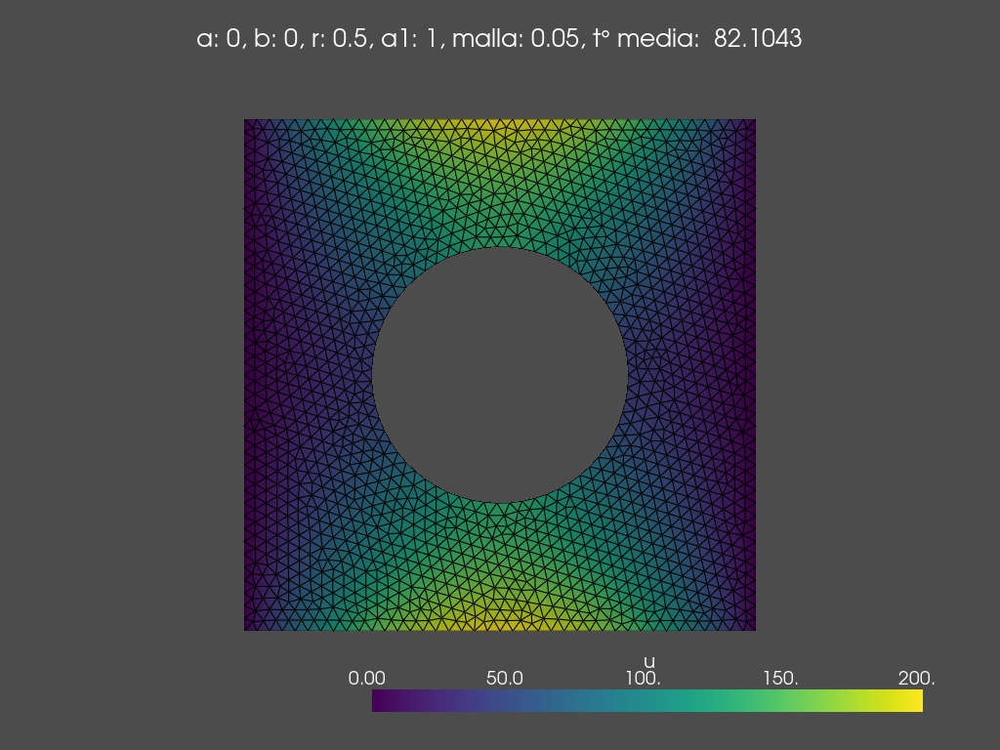

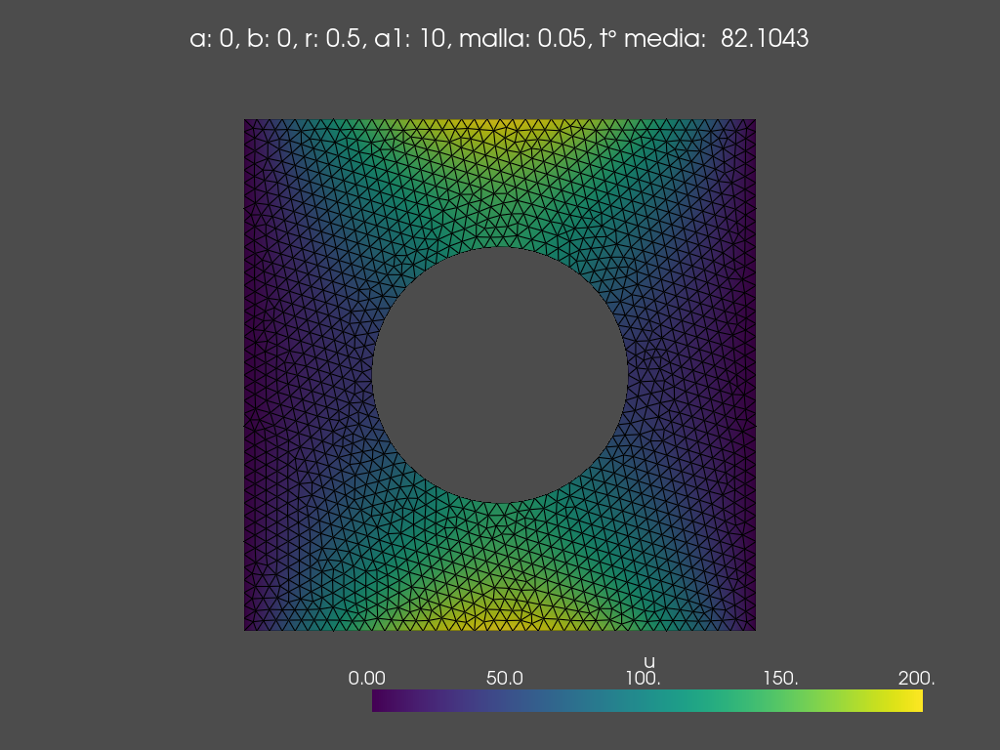

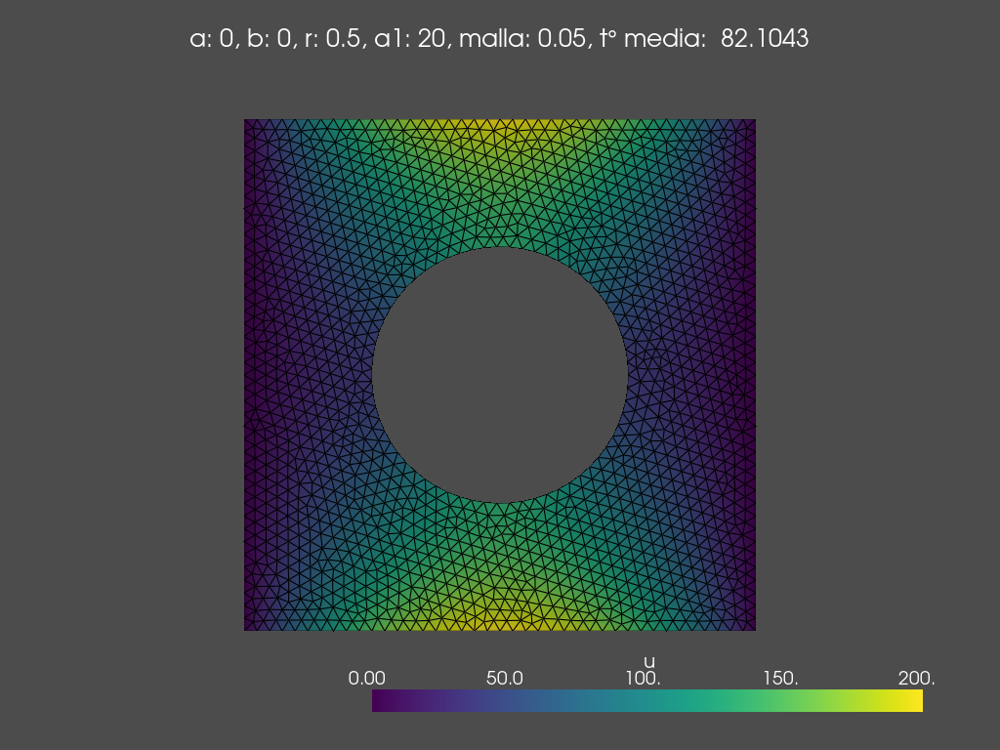

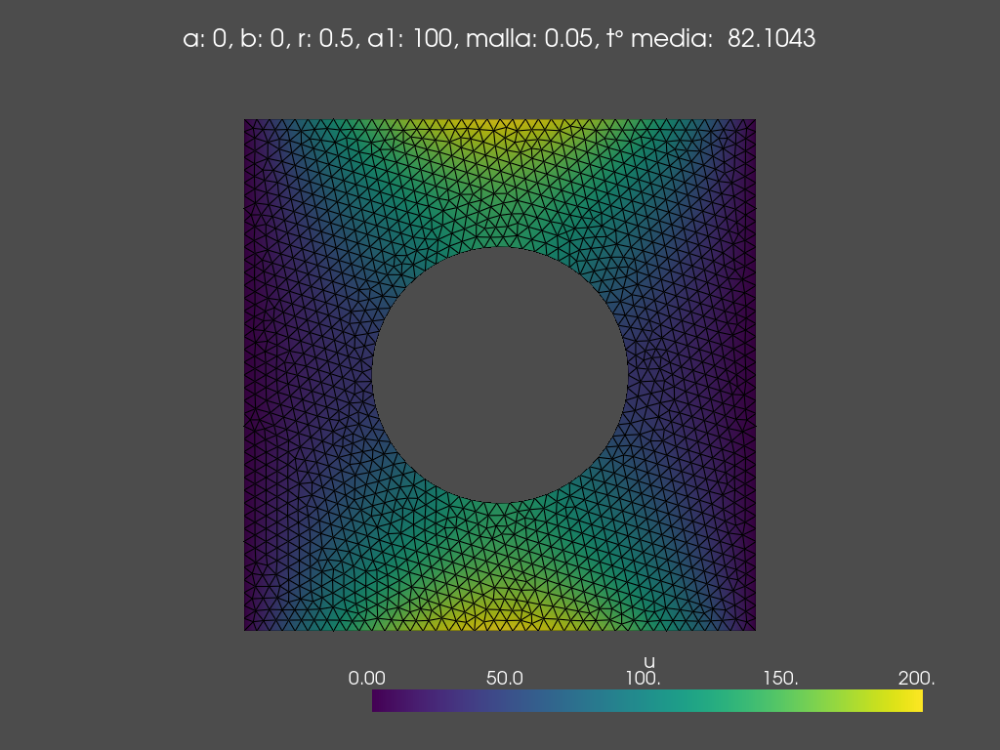

In [38]:
(a,b)=(0,0)
r = 0.5
a1s = [1, 10, 20, 100] 
for a1 in a1s:
  solve2(a=a, b=b, r=r, a1=a1, lmin=0.05, lmax=0.05)

**Comentarios:** No hay cambios ya que la constante $a_1$ se puede eliminar de la formulacion variacional. Por lo tanto, las soluciones son iguales al ser problemas equivalentes.

**c.** Podemos entender $\partial\Omega_2$ como la sección transversal de un cilindro que está siendo calentado por el horno. La temperatura media del borde del cilindro se puede calcular como:
$$\frac{1}{|\partial\Omega_2|}\int_{\partial\Omega_2}udS.$$


**c.1.** Encuentre la solución del problema para $r=0.4$ y $(a,b)\in\{(0,0),(0,0.4),(0.4,0.4)\}$. Grafique las soluciones y comente sus resultados en función de la temperatura media del borde del cilindro.

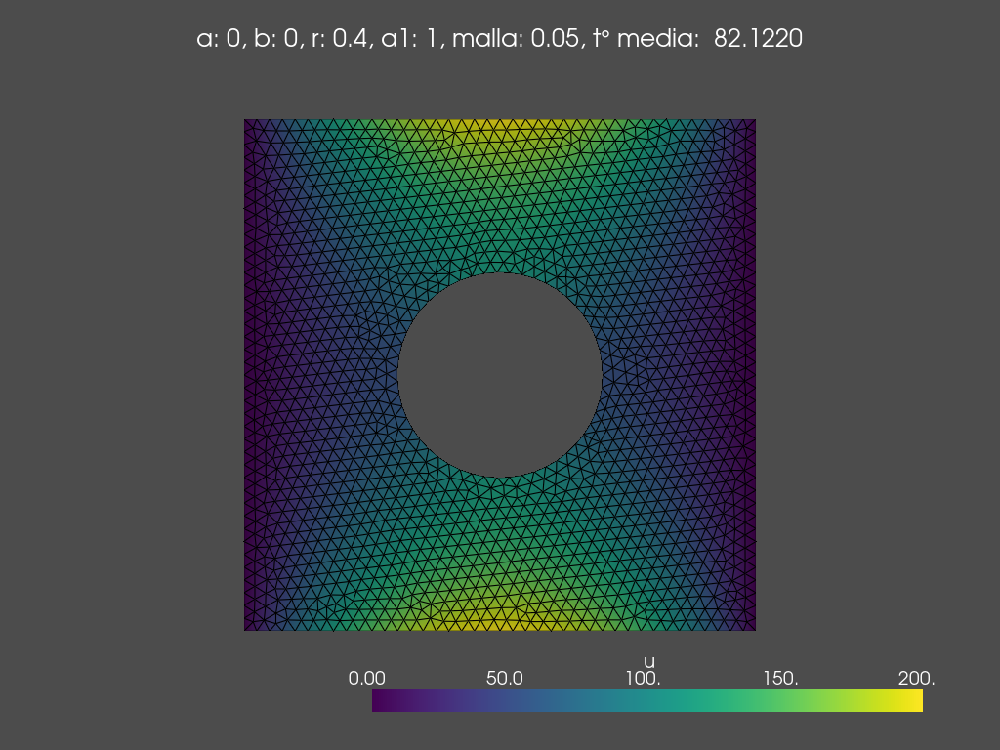

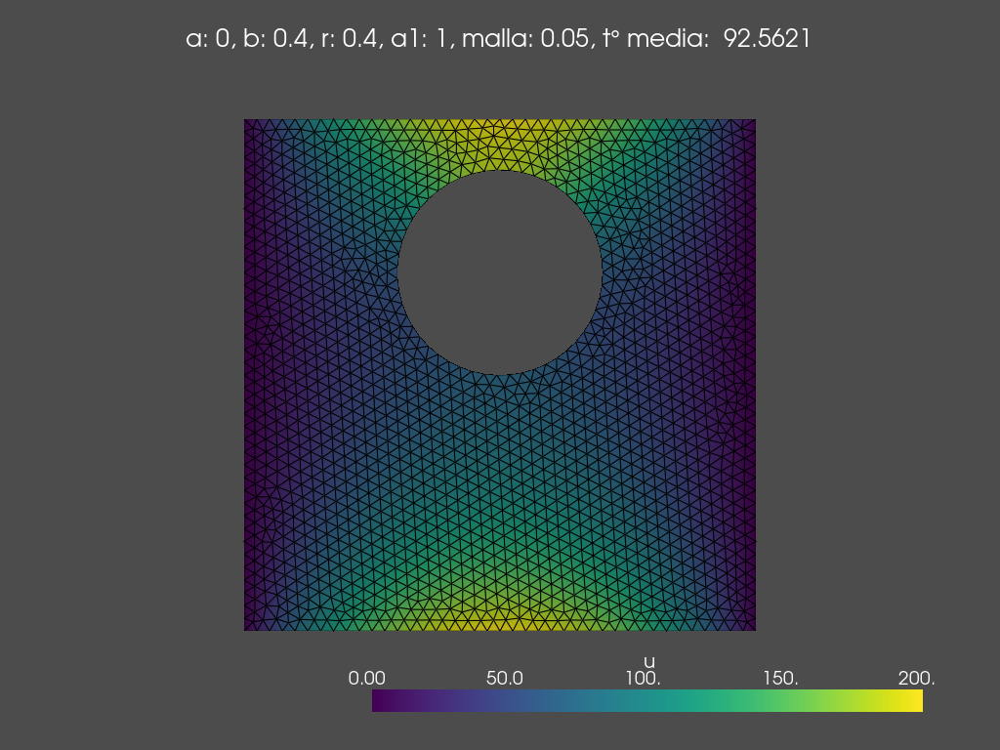

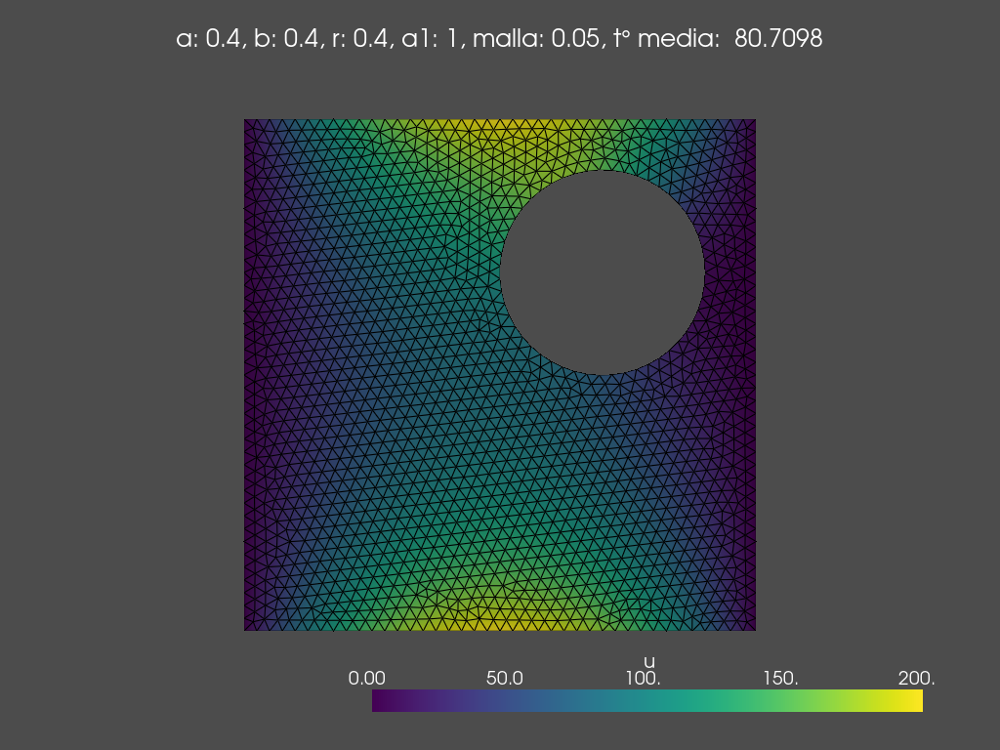

In [39]:
r = 0.4
a1 = 1
centers = [(0,0), (0,0.4), (0.4, 0.4)] 
for c in centers:
  solve2(a=c[0], b=c[1], r=r, a1=a1, lmin=0.05, lmax=0.05)

**Comentarios:** Para el circulo centrado se obtiene una temperatura media de  $82.1$ grados, centrado hacia arriba de $92.5$ y arriba hacia la derecha de $80.7$. Para los dos primeros caso, se observa que mientras mas cercano al borde superior la temperatura media aumenta, esto dado que los bordes horizontales poseen mayor temperatura que los bordes verticales. Ahora bien, para el ultimo caso la temperatura media esta entre las temperaturas medias obtenidas con los dos primeros circulos. Esto ya que que el borde circular esta cercano al borde superior caliente y al lado derecho helado.

**c.2.** Encuentre la solución del problema para $(a,b)=(0.0)$ y $r\in\{0.1, 0.5, 0.9\}$. Grafique las soluciones y comente sus resultados en función de la temperatura media del borde del cilindro.

r: 0.1


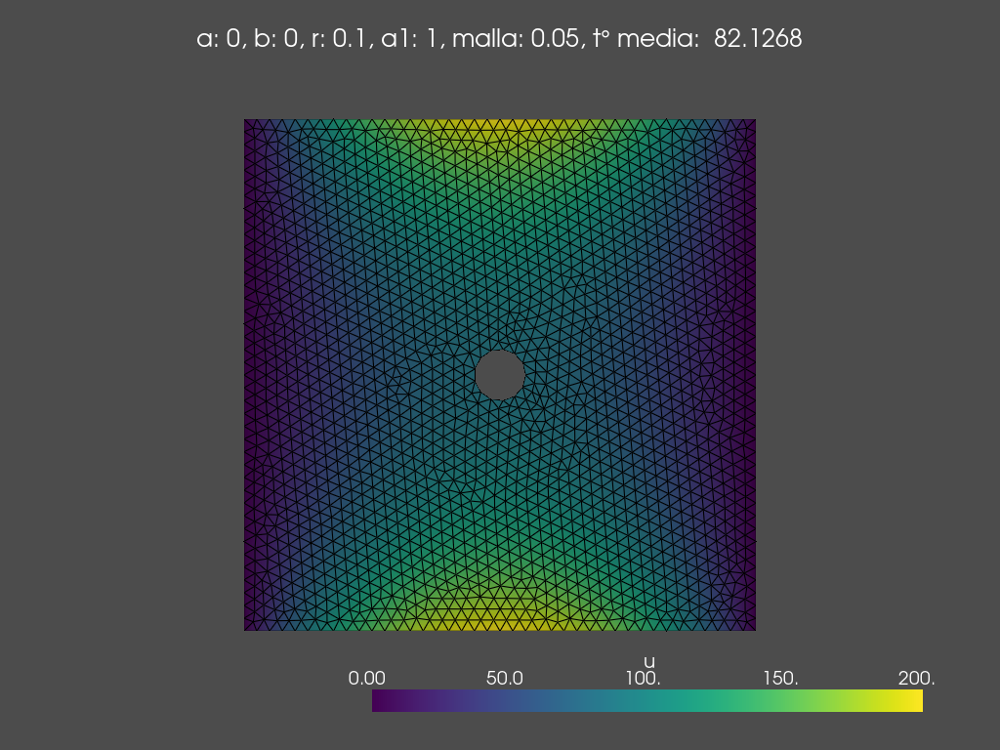

r: 0.5


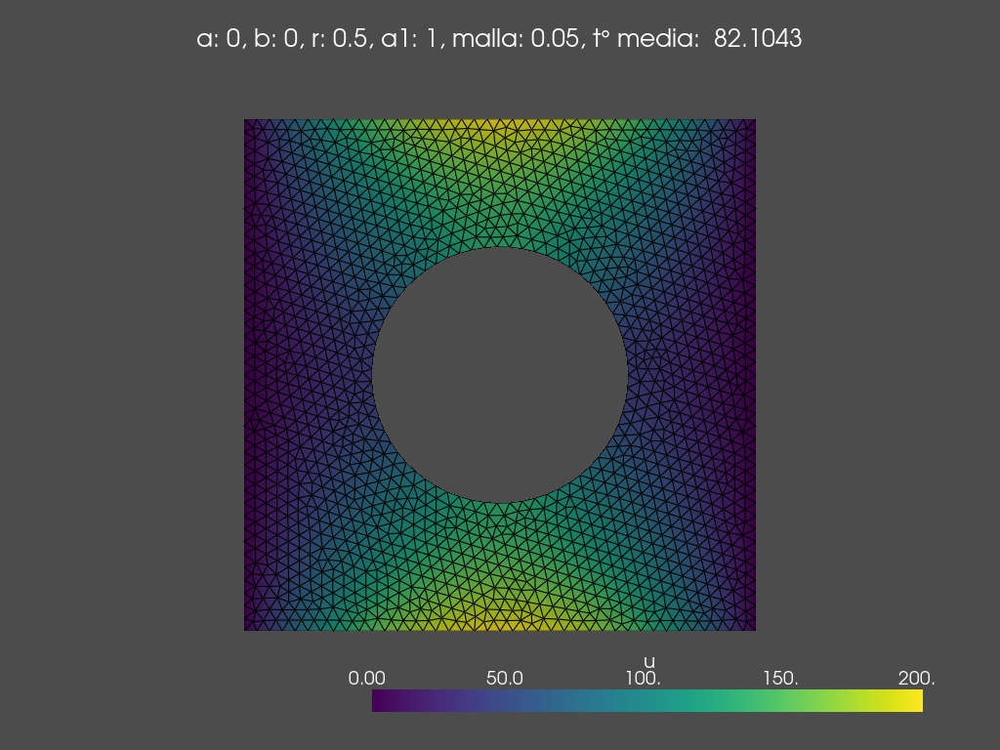

r: 0.9


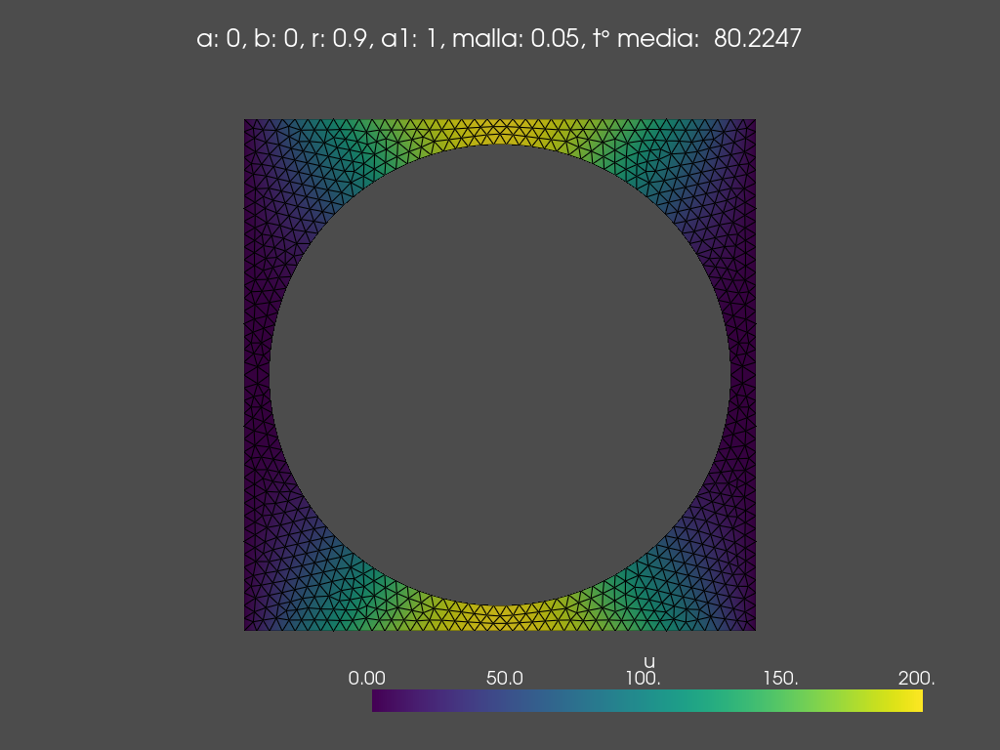

In [42]:
(a,b)=(0,0)
rs = [0.1, 0.5, 0.9]
for r in rs:
  # print("r:", r)
  solve2(a=a, b=b, r=r, a1=1, lmin=0.05, lmax=0.05)

**Comentarios:** Se obtiene valores similares, cercanos a $82$ grados. Sin embargo, existen diferencias posiblemente debidas a la discretizacion de la malla. Este valor es esperado, dada la simetria del dominio y condiciones de borde.

**c.3.** Encuentre la solución del problema para $(a,b)=(0,0)$ y $r=0.5$ con 3 mallas distintas (la idea es afinar la malla). Grafique las soluciones (junto con la malla) y comente sus resultados en funcion de la temperatura media del borde del cilindro.

l: 0.1


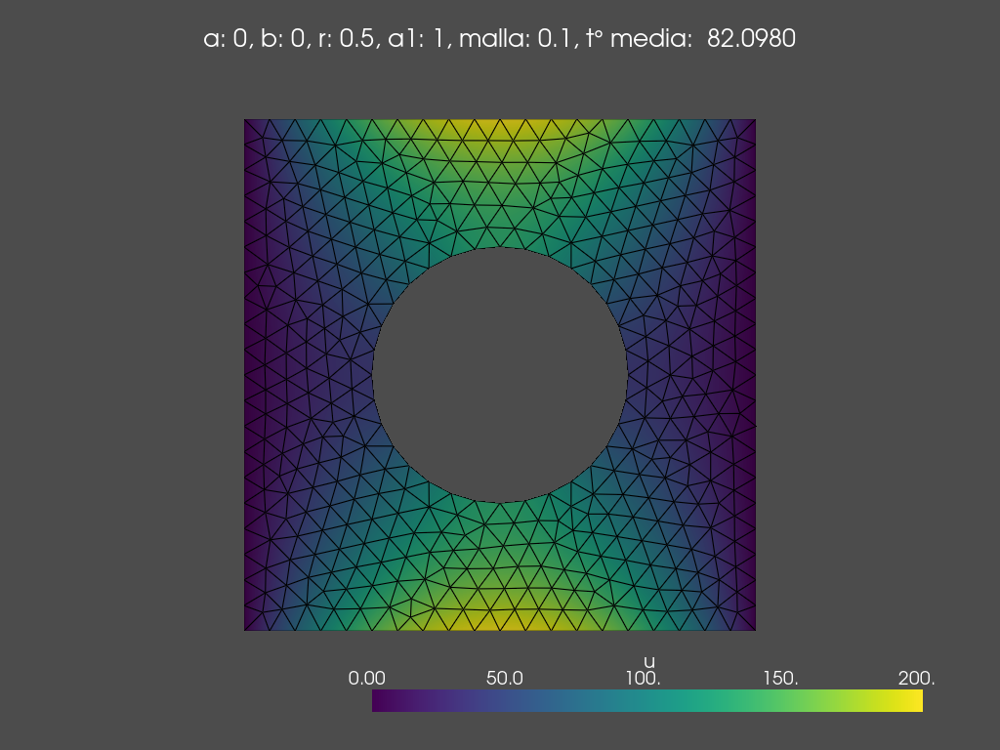

l: 0.05


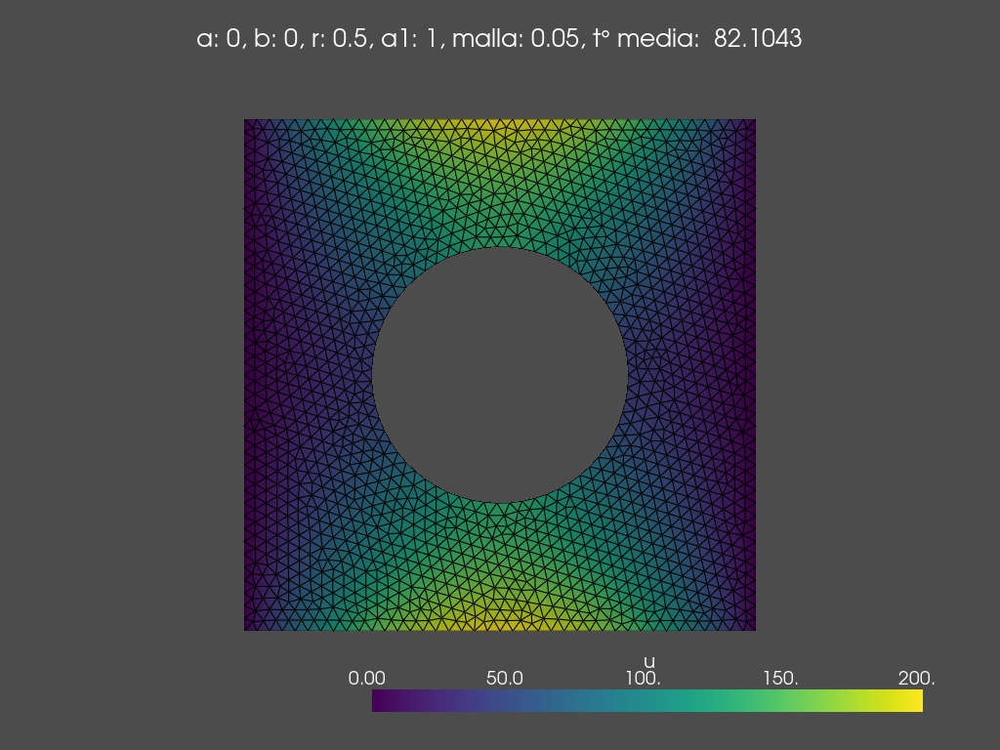

l: 0.025


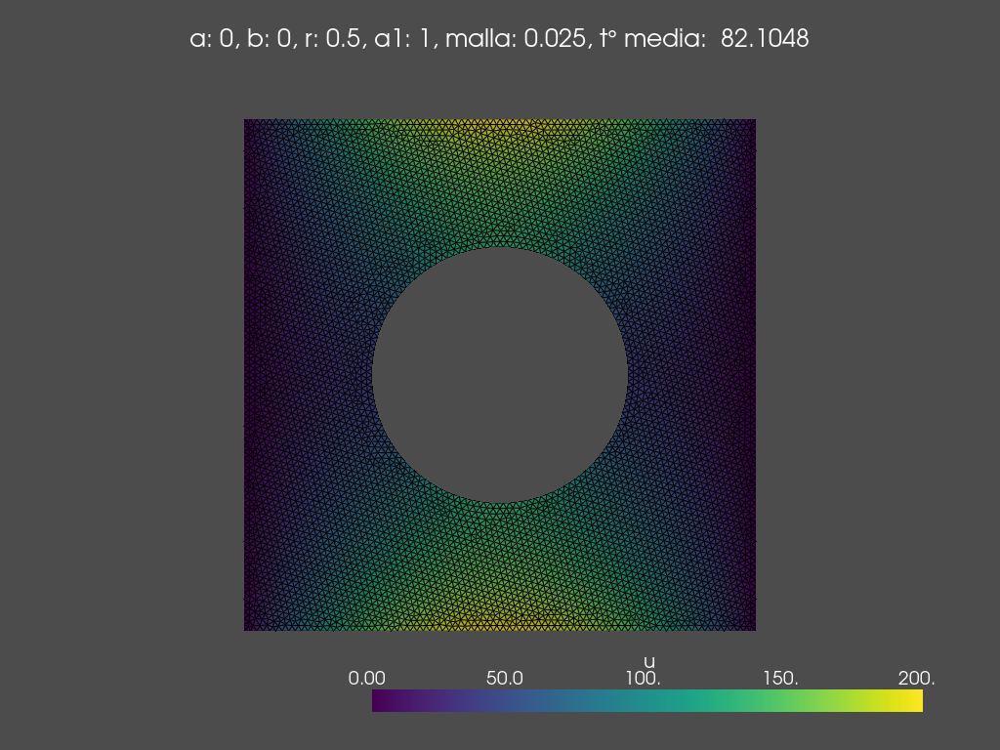

In [43]:
(a,b)=(0,0)
r = 0.5
ls = [0.1, 0.05, 0.025]
for l in ls:
  # print("l:", l)
  solve2(a=a, b=b, r=r, a1=1, lmin=l, lmax=l)

**Comentarios:** Ahora bien, mientras mas fina es la malla, se obtienen mejores aproximaciones de la temperatura media, dado que se consideran mas puntos en el borde de esta. Se observa, que los valores convergen a $82.1048$ grados.

# **Ejercicio 3**

**a.** Escriba un programa en Python que resuelva $(P_c)$ a través de su problema equivalente $(P)$ utilizando FEniCS. Grafique sus resultados para $(a,b)=(0,0)$, $r=0.5$, $a_1=1$ y $a_2=10$. Comente.

In [44]:
def solve3(a=0, b=0, r=0.5, lmin=0.05, lmax=0.05, a1=1, a2=10, bgrid=True): 
    #Primero, inicializar gmsh
    gmsh.initialize(sys.argv)

    #Parametros de la geometría
    gdim = 2

    #Definiendo el dominio
    domain = gmsh.model.occ.addRectangle(-1,-1,0, 2, 2)
    gmsh.model.occ.synchronize()

    #Definiendo la parte del dominio en la que se define la solución
    volumes = gmsh.model.getEntities(dim=gdim)
    status = gmsh.model.addPhysicalGroup(volumes[0][0], [volumes[0][1]])

    #Fijando parametros de la grilla y generándola
    gmsh.option.setNumber("Mesh.CharacteristicLengthMin",lmin)
    gmsh.option.setNumber("Mesh.CharacteristicLengthMax",lmax)
    gmsh.model.mesh.generate(gdim)

    #Todo lo de esta celda sirve para pasar la malla desde gmsh hasta dolphinx
    #solo importa si van a trabajar con multiprocesos, pero hay que correrlo igual.
    if MPI.COMM_WORLD.rank == 0:
        # Get mesh geometry
        geometry_data = io.extract_gmsh_geometry(gmsh.model)
        # Get mesh topology for each element
        topology_data = io.extract_gmsh_topology_and_markers(gmsh.model)

    # Extract the cell type and number of nodes per cell and broadcast
    # it to the other processors 
    if MPI.COMM_WORLD.rank == 0:
        # Extract the cell type and number of nodes per cell and broadcast
        # it to the other processors 
        gmsh_cell_type = list(topology_data.keys())[0]    
        properties = gmsh.model.mesh.getElementProperties(gmsh_cell_type)
        name, dim, order, num_nodes, local_coords, _ = properties
        cells = topology_data[gmsh_cell_type]["topology"]
        cell_id, num_nodes = MPI.COMM_WORLD.bcast([gmsh_cell_type, num_nodes], root=0)
    else:        
        cell_id, num_nodes = MPI.COMM_WORLD.bcast([None, None], root=0)
        cells, geometry_data = np.empty([0, num_nodes]), np.empty([0, gdim])

    # Permute topology data from MSH-ordering to dolfinx-ordering
    ufl_domain = io.ufl_mesh_from_gmsh(cell_id, gdim)
    gmsh_cell_perm = io.cell_perm_gmsh(cpp.mesh.to_type(str(ufl_domain.ufl_cell())), num_nodes)
    cells = cells[:, gmsh_cell_perm]

    # Generando el dominio
    domain = mesh.create_mesh(MPI.COMM_WORLD, cells, geometry_data[:, :gdim], ufl_domain)
    V = fem.FunctionSpace(domain, ("CG", 1))

    # Definiendo las fronteras del dominio
    def boundary_square_h(x):
        return np.isclose(abs(x[1]), 1)

    def boundary_square_v(x):
        return np.isclose(abs(x[0]), 1)

    dofs_h = fem.locate_dofs_geometrical(V, boundary_square_h)
    dofs_v = fem.locate_dofs_geometrical(V, boundary_square_v)

    #Función nula
    zero = fem.Function(V)
    zero.interpolate(lambda x: x[0]*0.0)

    #Función g(x,y)=alpha(1-x^2) con alpha=200
    fun1 = fem.Function(V)
    fun1.interpolate(lambda x: 200 * (1-x[0]*x[0]))

    #Definiendo las condiciones de borde
    bc_h = fem.dirichletbc(fun1, dofs_h)
    bc_v = fem.dirichletbc(zero, dofs_v)

    bcs = [bc_h, bc_v]

    #Formulación variacional
    u = ufl.TrialFunction(V)
    v = ufl.TestFunction(V)
    f = fem.Constant(domain, ScalarType(0.0))

    #Definiendo la función por partes a(x,y)
    A = fem.Function(V)
    def Ax(x):
      return a1+(a2-a1)*((x[0]-a)*(x[0]-a) + (x[1]-b)*(x[1]-b) <= r*r).astype(int)
    A.interpolate(Ax)

    A_F = A * ufl.dot(ufl.grad(u), ufl.grad(v))  * ufl.dx
    L = f * v * ufl.dx

    #Solución
    problem = fem.petsc.LinearProblem(A_F, L, bcs=bcs, petsc_options={"ksp_type": "preonly", "pc_type": "lu"})
    uh = problem.solve()

    #Extraemos información necesaria para graficar la grilla
    tdim = domain.topology.dim
    topology, cell_types, geometry = plot.create_vtk_mesh(domain, tdim)
    grid = pyvista.UnstructuredGrid(topology, cell_types, geometry)

    #Extraemos información del espacio funcional para graficar la solución
    u_topology, u_cell_types, u_geometry = plot.create_vtk_mesh(V)

    #Creamos la grilla de la función a evaluar
    u_grid = pyvista.UnstructuredGrid(u_topology, u_cell_types, u_geometry)
    u_grid.point_data["u"] = uh.x.array.real
    u_grid.set_active_scalars("u")
    u_plotter = pyvista.Plotter(notebook = True) #Importante el argumento notebook
    u_plotter.add_mesh(u_grid, show_edges=bgrid)
    u_plotter.view_xy()
    u_plotter.show()

    #Cerramos el gmsh
    gmsh.finalize()

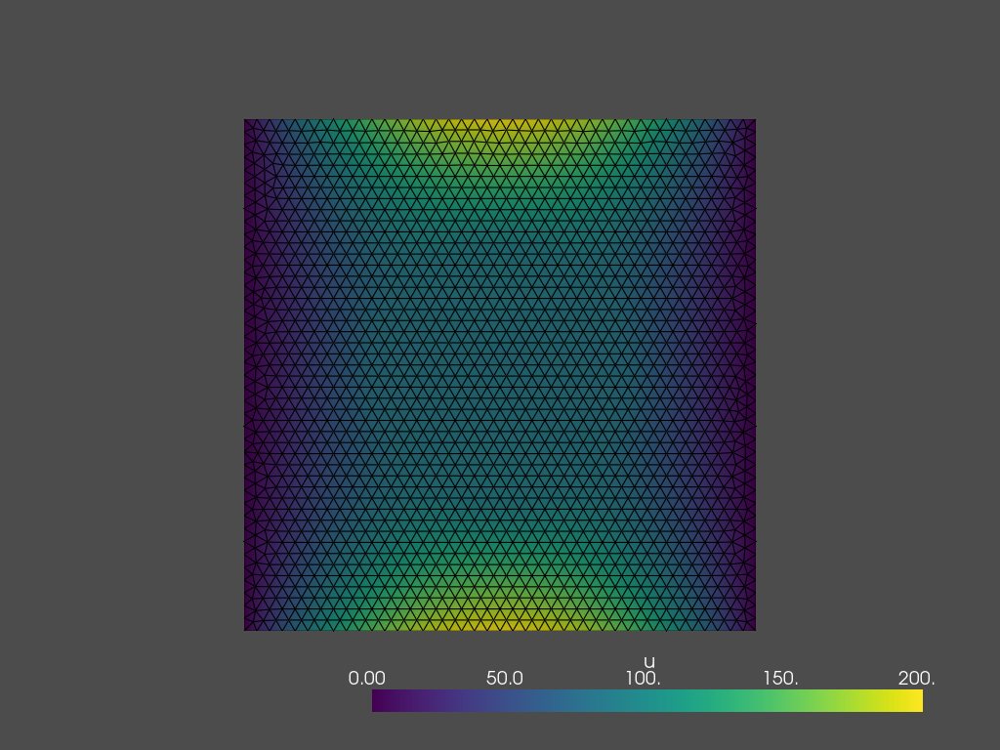

In [45]:
solve3(a=0, b=0, r=0.5, lmin=0.05, lmax=0.05, a1=1, a2=10, bgrid=True)

**Comentarios:** A diferencia del dominio perforado, esta vez la solucion del dominio $\Omega$ se extiende al interior del circulo, utilizando la informacion de su borde.

**b.** El problema $(P_c)$ se denomina "Problema de Transmision". Estudie numéricamente qué pasa cuando $a_2$ tiende a cero o tiende a infinito. Grafique sus resultados para 4 valores de $a_2$ a su elección en cada caso. Comente sus
resultados en relación a las soluciones obtenidas en $(P_a)$ y $(P_b)$.

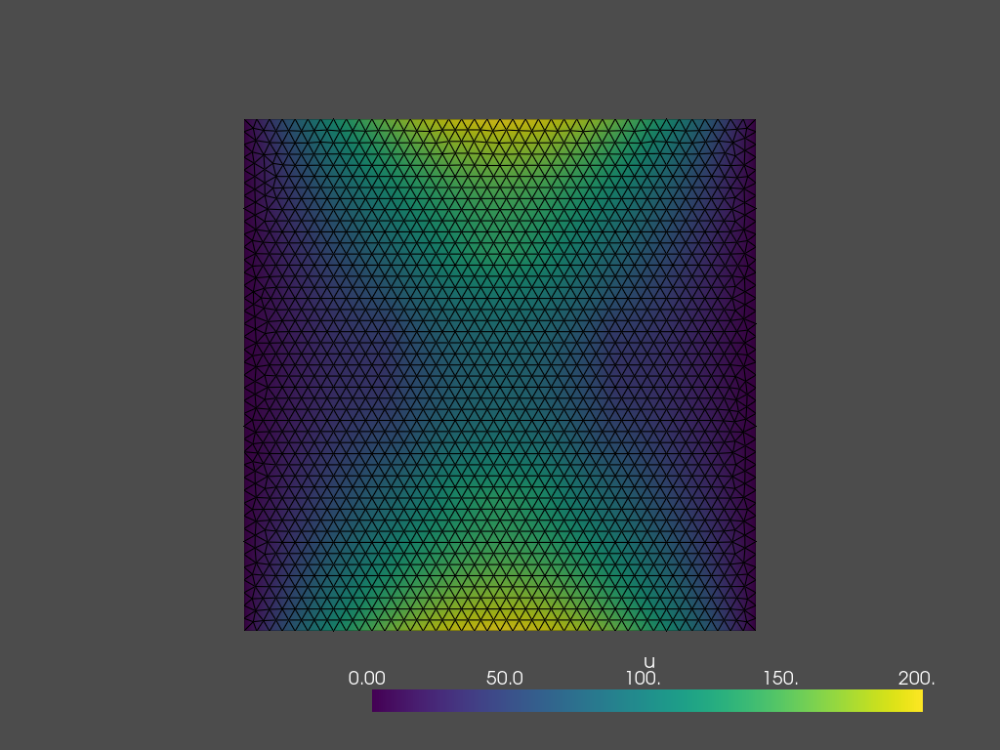

In [46]:
solve3(a=0, b=0, r=0.5, lmin=0.05, lmax=0.05, a1=1, a2=1e-13, bgrid=True)

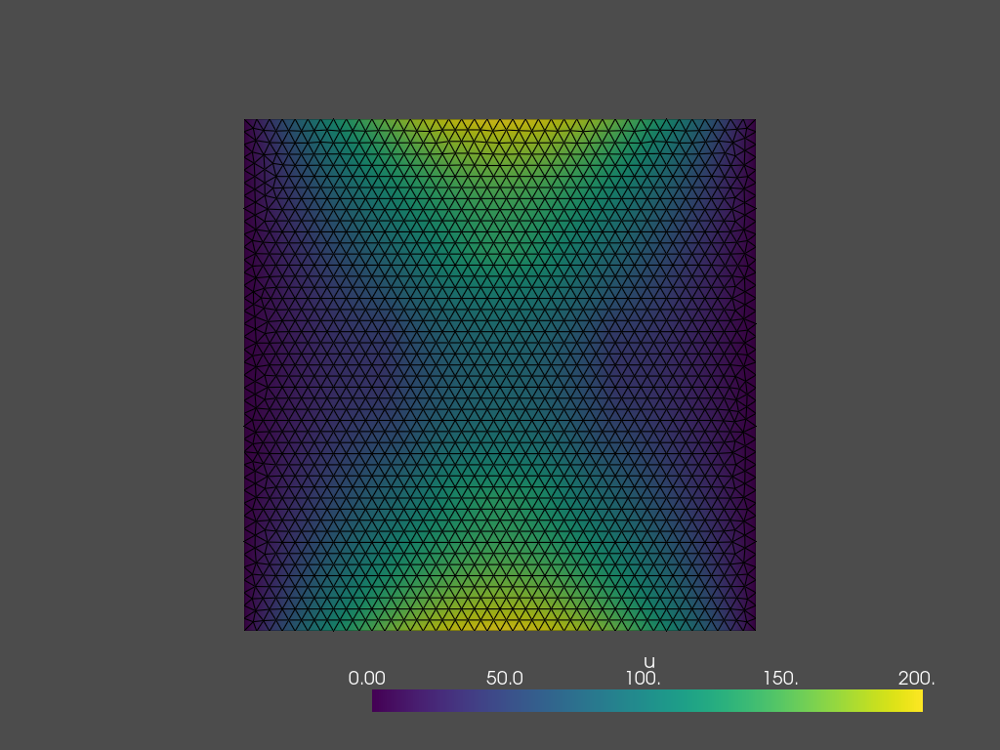

In [47]:
solve3(a=0, b=0, r=0.5, lmin=0.05, lmax=0.05, a1=1, a2=1e-5, bgrid=True)

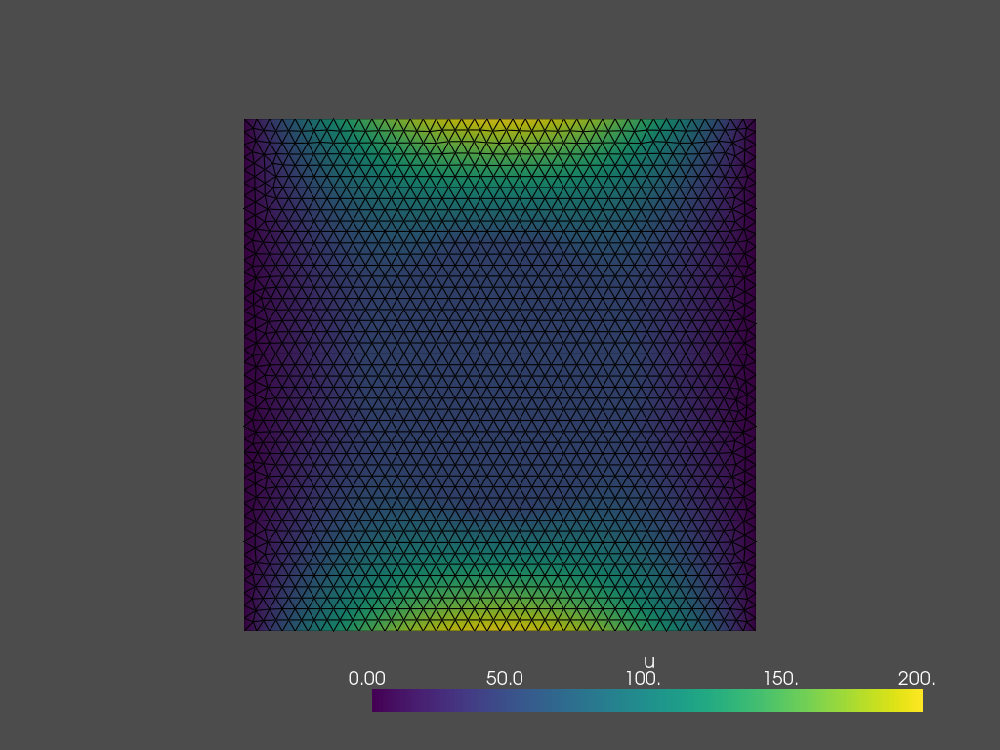

In [48]:
solve3(a=0, b=0, r=0.5, lmin=0.05, lmax=0.05, a1=1, a2=1e14, bgrid=True)

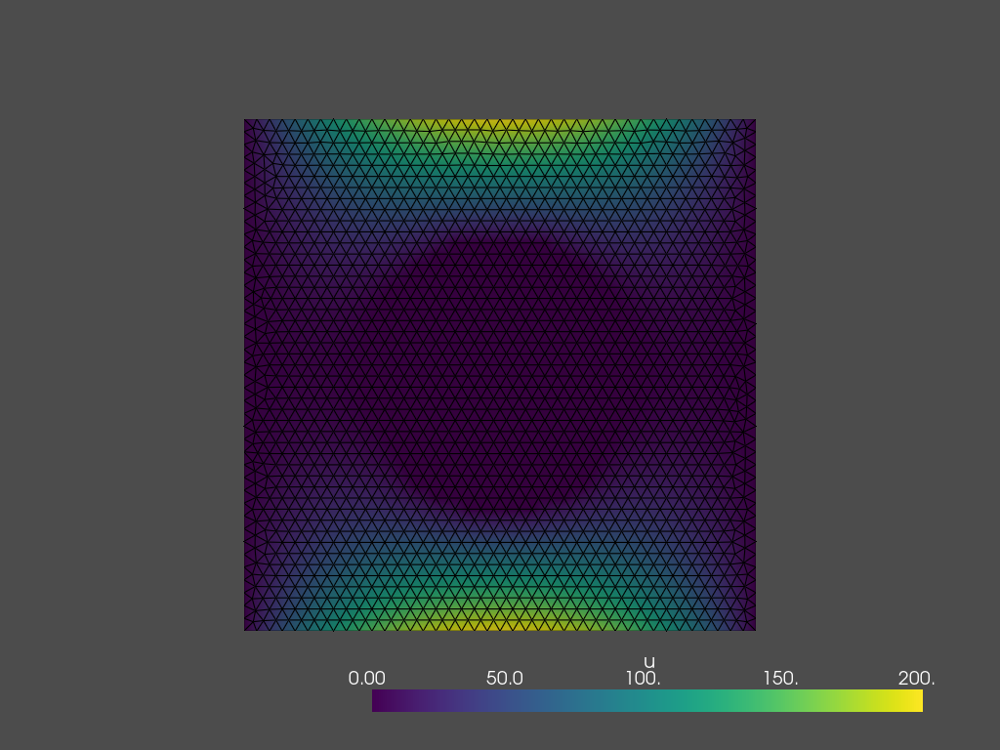

In [49]:
solve3(a=0, b=0, r=0.5, lmin=0.05, lmax=0.05, a1=1, a2=1e20, bgrid=True)

**Comentarios:**

Para $a_2 \sim 0$ (1e-10), es similar a la ecuacion $P_b$ con $∂u/∂n = 0$ en el borde. Mientras que para $a_2 \sim ∞$ (1e20), obtenemos un resultado similar al caso $u=0$ en el borde, similar a $P_a$. Este ultimo caso se interpreta de esta manera por lo siguiente:
